In [1]:
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch
from PIL import Image, ImageDraw
import requests
import random
from os import listdir
from os.path import isfile, join, splitext
from functools import reduce

In [2]:
detr_resnet50_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
detr_resnet50_model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

/Users/philip/miniforge3/lib/python3.10/site-packages/transformers/models/detr/image_processing_detr.py:776: FutureWarning: The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.
  warnings.warn(


In [3]:
def isimage(path):
    if not isfile(path):
        return False
    file_name, file_extension = splitext(path)
    return file_extension == ".jpg"


def get_image(images_dir = "./images"):
    return Image.open(join(images_dir, random.choice([f for f in listdir(images_dir) if isimage(join(images_dir, f))])))

def get_line_for_points(points):
    # get to y = c + slope*x
    slope = (points[0][1] - points[1][1]) / (points[0][0] - points[1][0]) 
    # c = y - slope*x
    c = points[0][1] - slope * points[0][0]
    return lambda x: c + slope * x

def is_point_above_line(line, coords):
    return line(coords[0]) < coords[1]

def is_box_above_line(line, box_coords):
    return reduce(lambda f, cf: cf and f, list(map(lambda point: is_point_above_line(line, point), box_coords)))


In [4]:
def run_detection(image, processor, model, scaled_divider_separator_coords, target_labels, threshold=0.7):
    rs = []
    [image_width, image_height] = get_image().size
    divider_separator_coords = list(map(lambda coord: (coord[0] * image_width, coord[1] * image_height), scaled_divider_separator_coords))
    line = get_line_for_points(divider_separator_coords)
    
    inputs = processor(images=image, return_tensors="pt")
    outputs = model(**inputs)

    # convert outputs (bounding boxes and class logits) to COCO API
    target_sizes = torch.tensor([image.size[::-1]])
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=threshold)[0]

    image_overlay = ImageDraw.Draw(image)
    
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = [round(i, 2) for i in box.tolist()]
        lbl = model.config.id2label[label.item()]
        
        if lbl not in target_labels:
            continue
        
        # reverse coords (top left is 0,0)
        is_above = not is_box_above_line(line, [(box[0], box[1]), (box[2], box[3])])
        image_overlay.rectangle((box[0], box[1], box[2], box[3]), outline="blue" if is_above else "yellow", width=3)

        rs.append({ "label": lbl, "box": box, "side": "right" if is_above else "left", "score": round(score.item(), 3)})
        
        
    # lane separator
    image_overlay.line(divider_separator_coords, width=5, fill="green")

    return [rs, image]


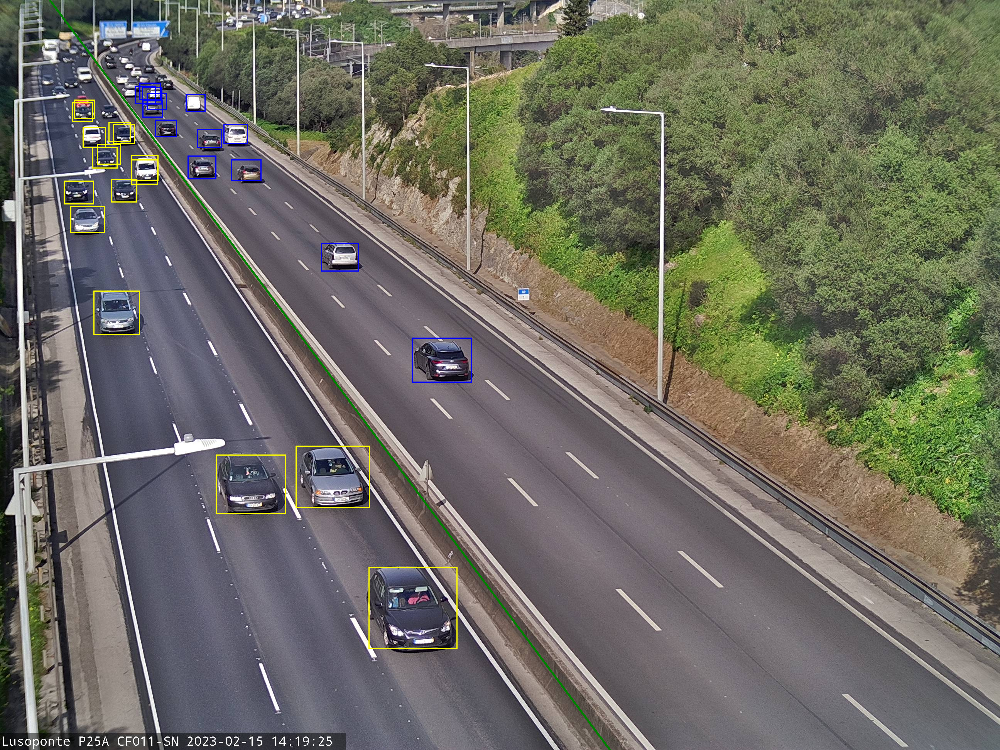

In [9]:
[results, image] = run_detection(get_image(), detr_resnet50_processor, detr_resnet50_model, [(0.05, 0), (0.61, 1)], ['car', 'motorcycle', 'bus', 'truck'], 0.7)
image